In [2]:
import numpy as np
import matplotlib.pyplot as plt
import sys, os, glob, re
import sklearn
%matplotlib inline  

# Get Data

In [3]:
snid_dir = './allSNIDtemp/'
os.chdir('./allSNIDtemp/')
all_spec = glob.glob('*.lnw')
os.chdir('..')

In [4]:
# Get List of spectra files that are type Ib or Ic

# For some reason, these files do not have a standard organization, which makes it
# stupidly aggravating to load them all. Here we search for spectra of type Ib or Ic
# and find the line number where the wavelength 2501.69 appears (this is the first).
Ib_Ic = []
Ib_Ic_names = []
skiprows = []
for spec_name in all_spec:
    path = snid_dir + spec_name
    with open(path, 'r') as f:
        lines = f.readlines()
        header = lines[0].split()
        SN_type = int(header[-2])
        if ((SN_type == 2) or (SN_type == 3)): 
            Ib_Ic.append(path)
            Ib_Ic_names.append(spec_name)
            #the first observed wavelength is always 2501.69
            first_wvl = '2501.69'
            for i in range(len(lines)-1):
                line = lines[i]
                if first_wvl in line:
                    skiprows.append(i)
                    break

In [5]:
print "There are %d type Ib and Ic SN"%(len(Ib_Ic))

There are 153 type Ib and Ic SN


In [6]:
# For each spectra, skip all the header lines about removing continuum and load the phase=0
# spectra into a numpy array. Do some data processing like filtering for desired wavelengths and 
# normalizing data.

min_wavelength = 4000
max_wavelength = 7000

spectra = []
for i in range(len(Ib_Ic)-1):
    spec = Ib_Ic[i]
    skiprow = skiprows[i]
    s = np.loadtxt(spec,skiprows=skiprow, usecols=(0,1))
    
    # check that first wvl is 2501.69
    if not(s[0][0] == 2501.69): print 'first wavelength is not 2501.69'
    
    # filter for desired wavelengths
    mask = np.logical_and(s[:,0]>min_wavelength, s[:,0]<max_wavelength)
    s = s[mask]
    spectra.append(s)

In [7]:
# Organize spectra in an (N x M) array, where N is the number of spectra, and M is the dimensionality
# (ie number of data points in spectrum) of a spectrum. We treat each wavelength as independent
# and zero the means and unify the standard deviations.

wavelengths = np.array(spectra[0][:,0])
spectra_matrix = np.ndarray((len(spectra),spectra[0].shape[0]))
for i, spec in enumerate(spectra):
    spectra_matrix[i,:] = spec[:,1]
    
#spectra_mean = np.mean(spectra_matrix, axis=1)
#spectra_std = np.std(spectra_matrix, axis=1)



In [8]:
# replace 0 values with NaN's

for i in range(spectra_matrix.shape[0]):
    spectra_matrix[i][spectra_matrix[i]==0] = np.nan

In [9]:
spectra_mean = np.nanmean(spectra_matrix, axis=1)
spectra_std = np.nanstd(spectra_matrix, axis=1)
original_spectra = np.copy(spectra_matrix)
spectra_matrixT = (spectra_matrix.T - spectra_mean)/spectra_std
spectra_matrix = spectra_matrixT.T

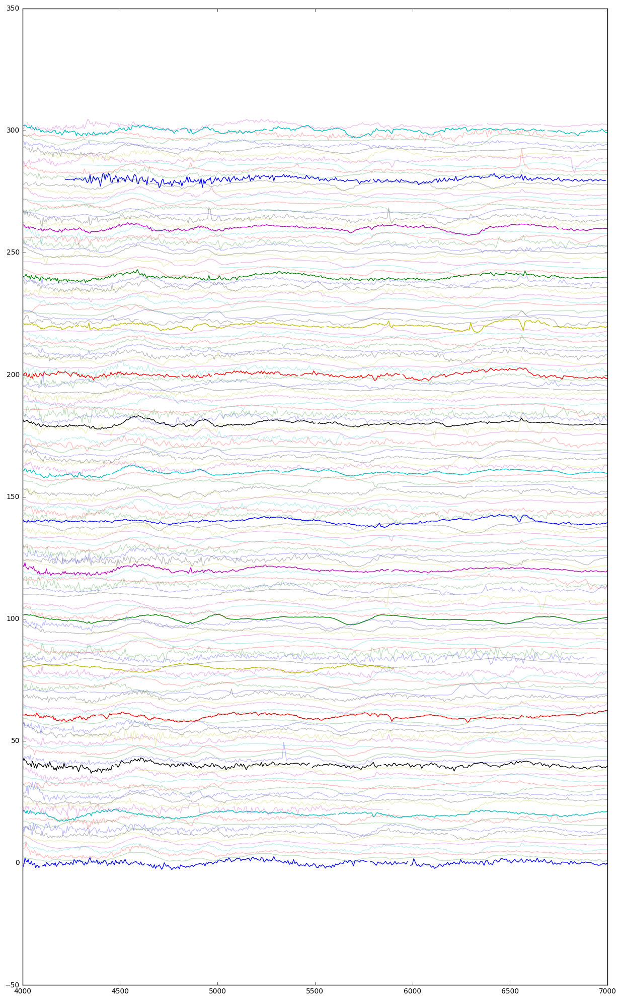

In [10]:
plt.figure(figsize=(15,25))
for i,spec in enumerate(spectra_matrix):
    alpha=0.25
    if not i%10:
        alpha=1
    plt.plot(wavelengths,spec+i*2, alpha=alpha)

# Data Cleaning

## Test spectrum interpolation

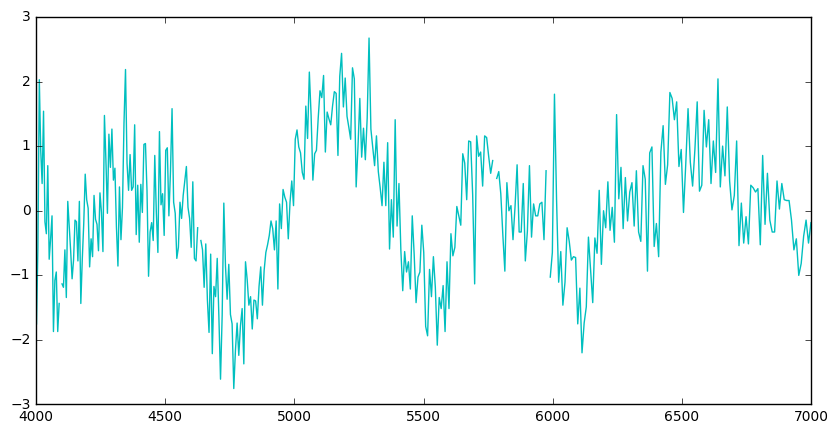

In [11]:
test_spec = spectra_matrix[0]
plt.figure(figsize=(10,5))
plt.plot(wavelengths,test_spec,'c')

In [12]:
from scipy.interpolate import interp1d

In [13]:
good_values = np.isfinite(test_spec)
interp_fn = interp1d(wavelengths[good_values],test_spec[good_values])

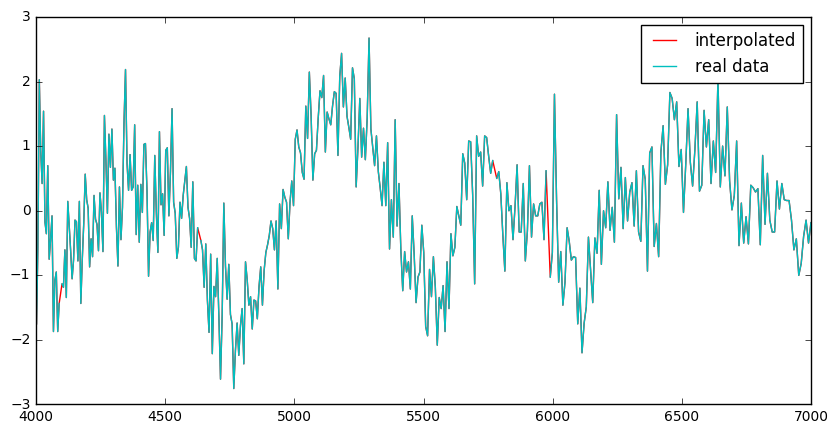

In [14]:
plt.figure(figsize=(10,5))
p1 = plt.plot(wavelengths,interp_fn(wavelengths),'r',label="interpolated")
p2 = plt.plot(wavelengths,test_spec,'c',label="real data")
plt.legend()

## Re-bin (lower resolution b/c don't care about noise)

In [15]:
print spectra_matrix.shape
print wavelengths.shape

(152, 414)
(414,)


In [16]:
nrows, ncols = spectra_matrix.shape
smoothing = 9 # Width of bins in terms of number of wavelength steps
tmp = np.reshape(spectra_matrix,(nrows, ncols/smoothing, smoothing))

In [17]:
spectra_matrix = np.nanmean(tmp, axis=2)

/home/data/mew488/virtualenvs/mypy2.7/lib/python2.7/site-packages/numpy/lib/nanfunctions.py:703: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


In [18]:
spectra_matrix.shape

(152, 46)

In [19]:
wvrows = wavelengths.shape[0]
wvcols = 1
wvtemp = np.reshape(wavelengths, (wvrows/smoothing,1,smoothing))
print wvtemp.shape
wavelengths = np.nanmean(wvtemp, axis=2)

(46, 1, 9)


In [20]:
wavelengths.shape

(46, 1)

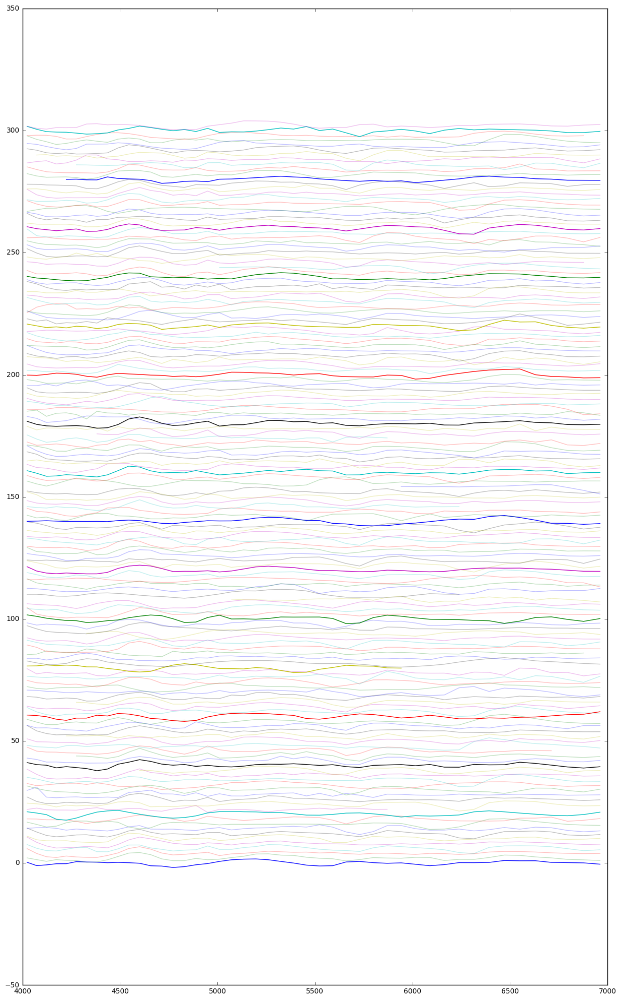

In [21]:
# Plot the spectra post data processing

plt.figure(figsize=(15,25))
for i,spec in enumerate(spectra_matrix):
    alpha=0.25
    if not i%10:
        alpha=1
    plt.plot(wavelengths,spec+i*2, alpha=alpha)

## PCA Decomposition

In [22]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import Imputer


imp = Imputer(missing_values='NaN', strategy='mean', axis=1, verbose=0, copy=True)


In [23]:
spectra_matrix = imp.fit_transform(spectra_matrix)

In [24]:
spectra_matrix.shape

(152, 46)

In [25]:
spectra_matrix

array([[  3.08110342e-01,  -1.05943005e+00,  -7.55918411e-01, ...,
          1.73460211e-01,   6.51546711e-02,  -4.70518676e-01],
       [  1.06116852e-01,  -6.09024824e-01,  -1.29722239e+00, ...,
         -5.01248370e-01,  -6.97715863e-01,  -9.76138368e-01],
       [  1.89919854e+00,  -8.14368436e-02,  -1.41597959e+00, ...,
         -2.55249808e-02,  -1.52032630e-01,  -5.94109583e-02],
       ..., 
       [ -5.31457885e-02,   1.18170134e-01,   8.46257578e-02, ...,
         -2.34045819e-01,  -1.05858380e-01,  -1.04551487e-03],
       [  1.73599705e+00,   5.30776294e-01,  -4.12083484e-01, ...,
         -8.09724346e-01,  -8.11090810e-01,  -2.87735310e-01],
       [ -2.06601622e-01,  -1.05624536e+00,  -1.38487841e+00, ...,
         -1.75647628e-01,   2.66386973e-01,   4.96661543e-01]])

In [26]:
pca = PCA()

In [27]:
pca.fit(spectra_matrix)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [28]:
pca.components_

array([[-0.16119269, -0.03674899,  0.06244638, ...,  0.00196717,
         0.00798752, -0.03632256],
       [ 0.11195768,  0.16125381,  0.12470189, ...,  0.01849433,
        -0.05828052, -0.01887931],
       [ 0.20408339,  0.03103119, -0.12644488, ..., -0.00224844,
        -0.01479419, -0.14736794],
       ..., 
       [ 0.02762541, -0.01731498, -0.03021719, ...,  0.00141353,
        -0.13372349, -0.03468189],
       [-0.01194584,  0.04586552, -0.06653058, ...,  0.02631305,
         0.02046964,  0.05263961],
       [ 0.15404198,  0.14650241,  0.15189973, ...,  0.15248572,
         0.15091148,  0.15452398]])

/home/data/mew488/virtualenvs/mypy2.7/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


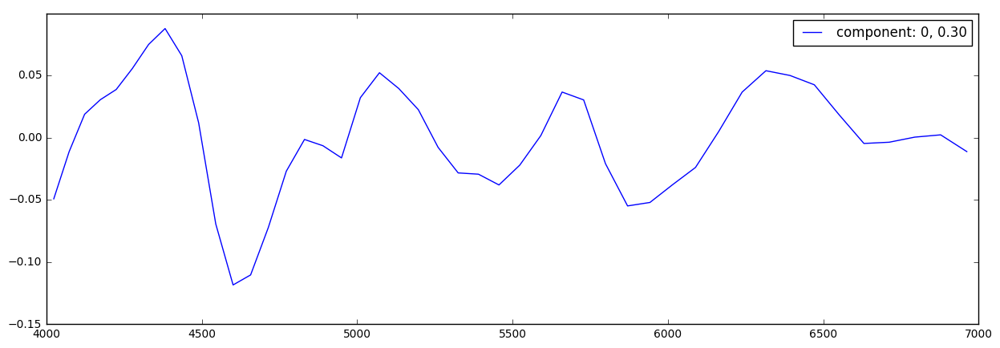

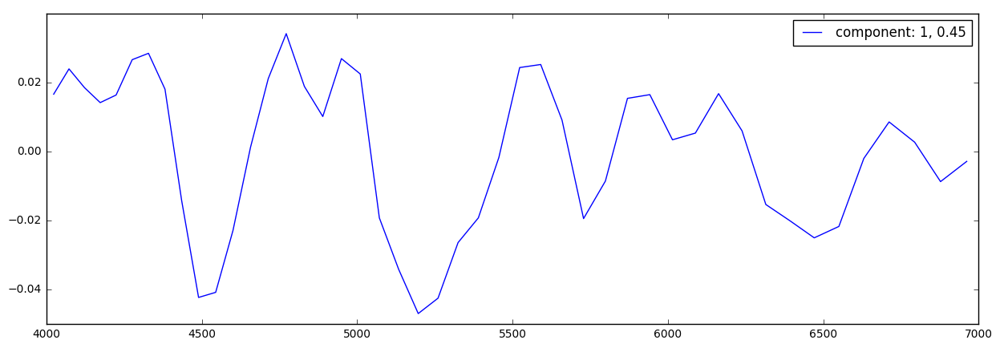

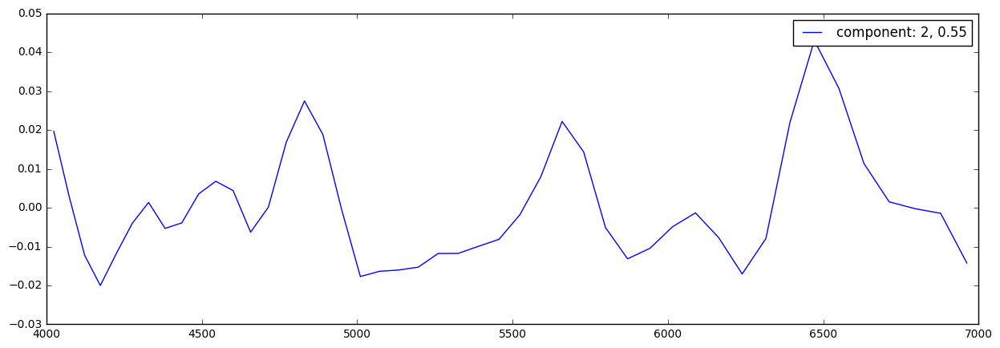

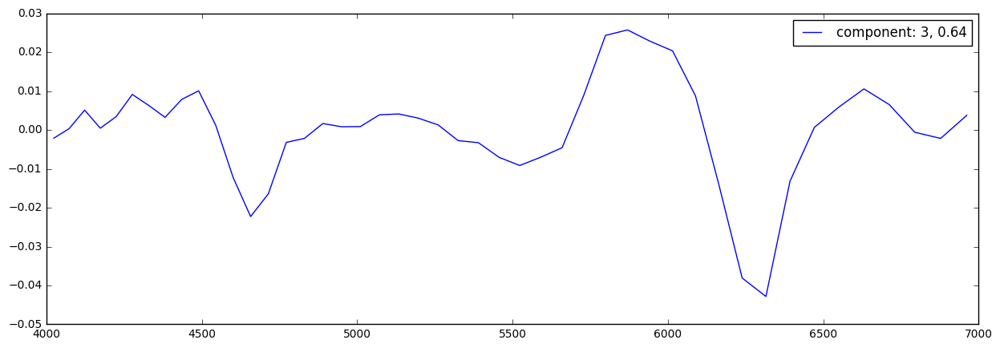

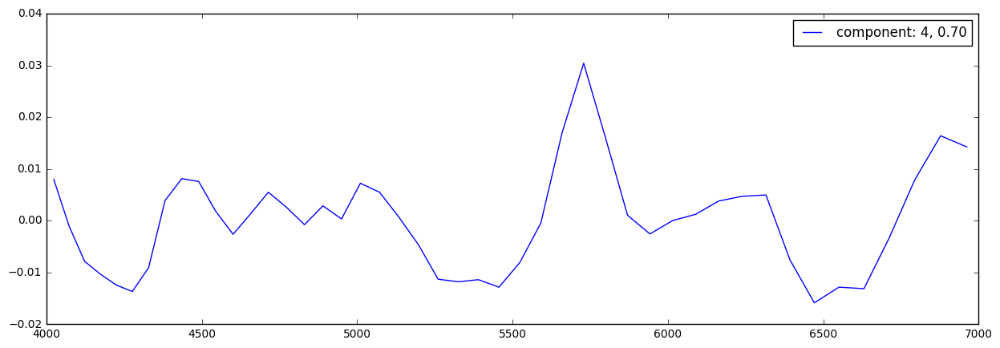

...

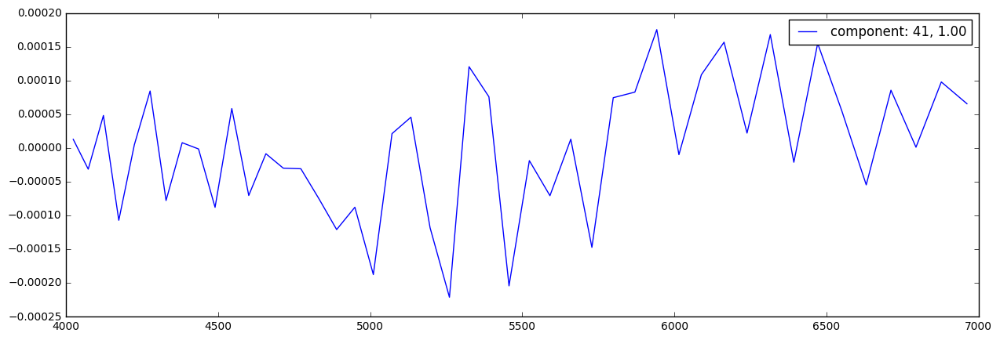

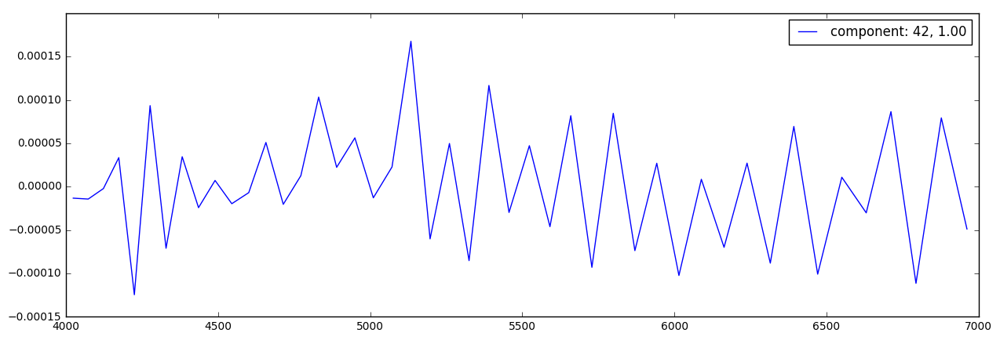

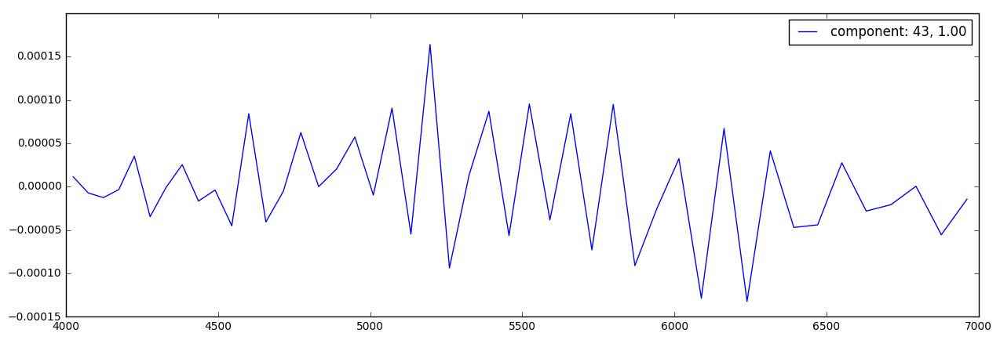

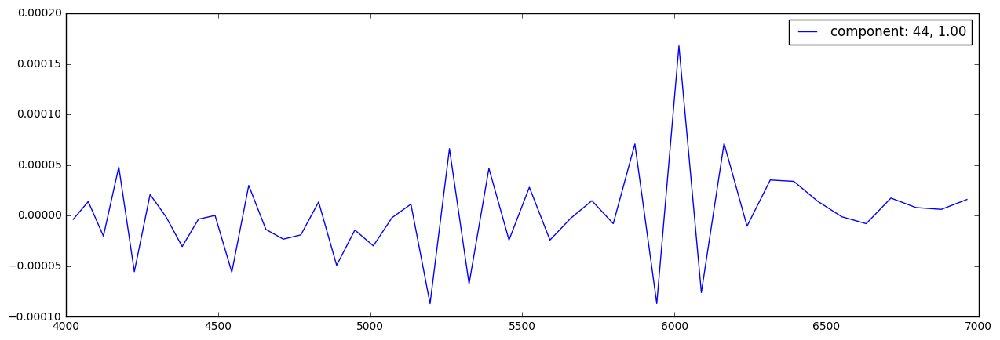

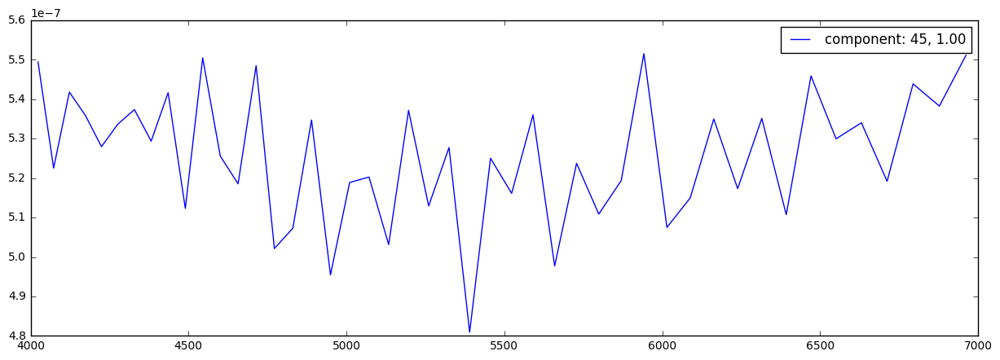

In [29]:
evecs = pca.components_
evals = pca.explained_variance_ratio_
evals_cs = evals.cumsum()

for i,ev in enumerate(evecs):
    plt.figure(figsize=(15,5))
    plt.plot(wavelengths,evals[i]*(ev), label="component: %d, %.2f"%(i,evals_cs[i]))
    plt.legend(fontsize=12)

In [30]:
spectra_mean.shape

(152,)

## Recreate Spectra from PCA

[0, 4, 8, 20, 46]


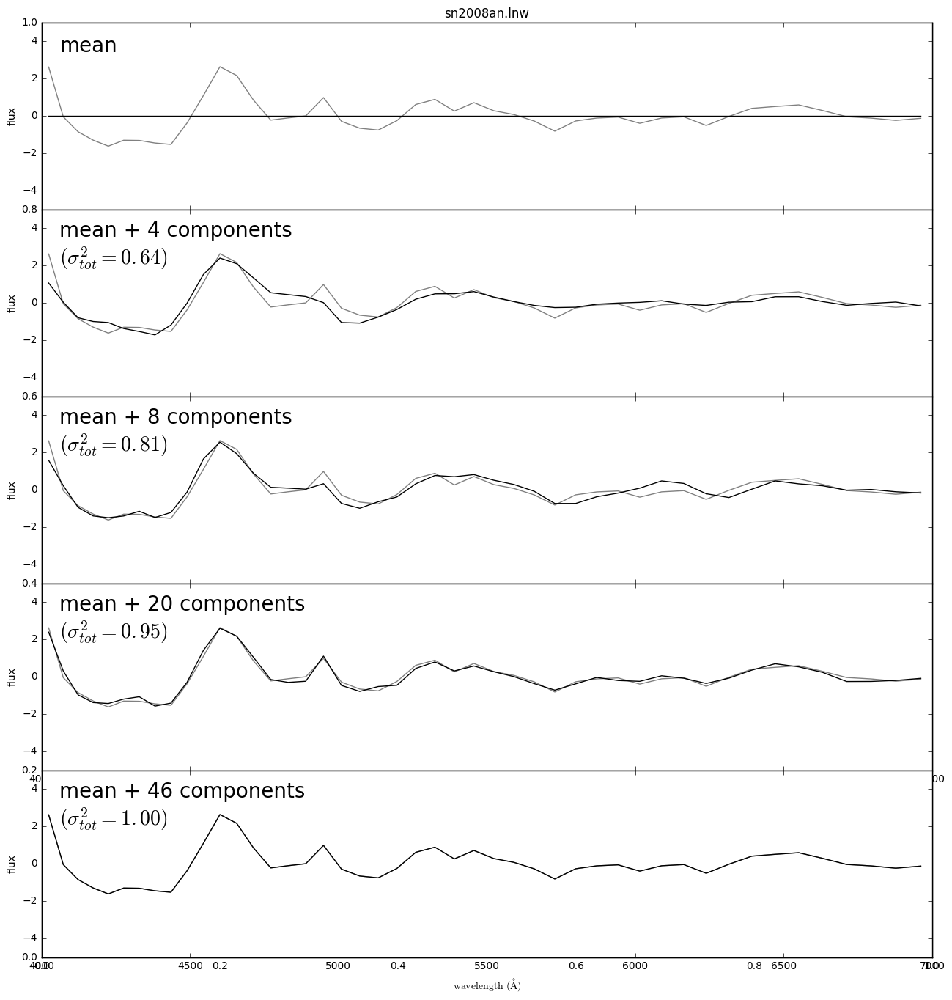

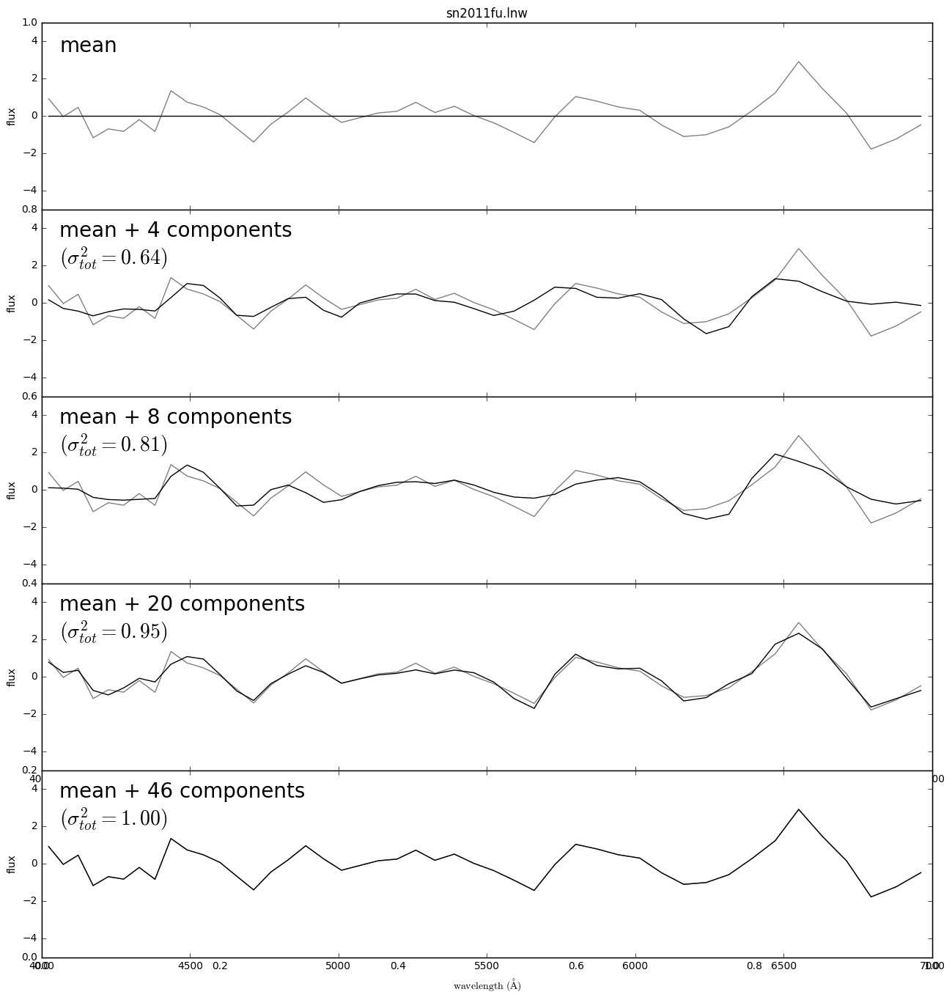

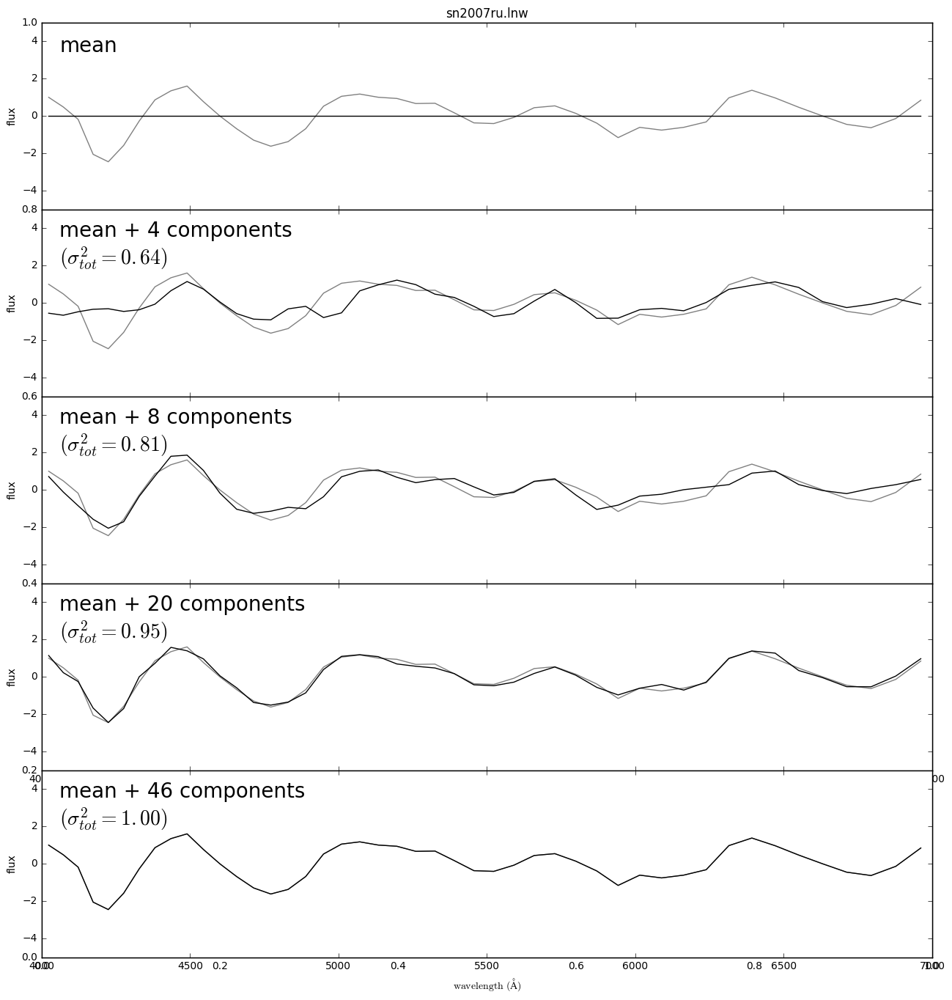

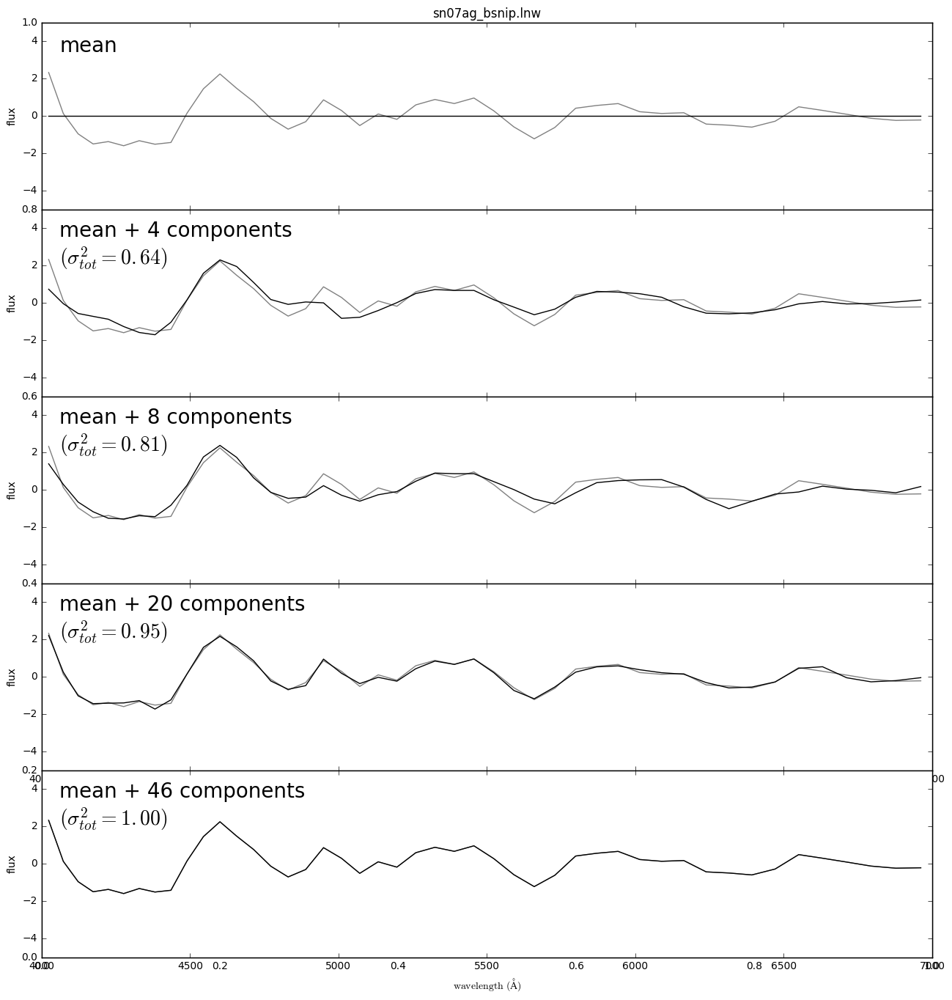

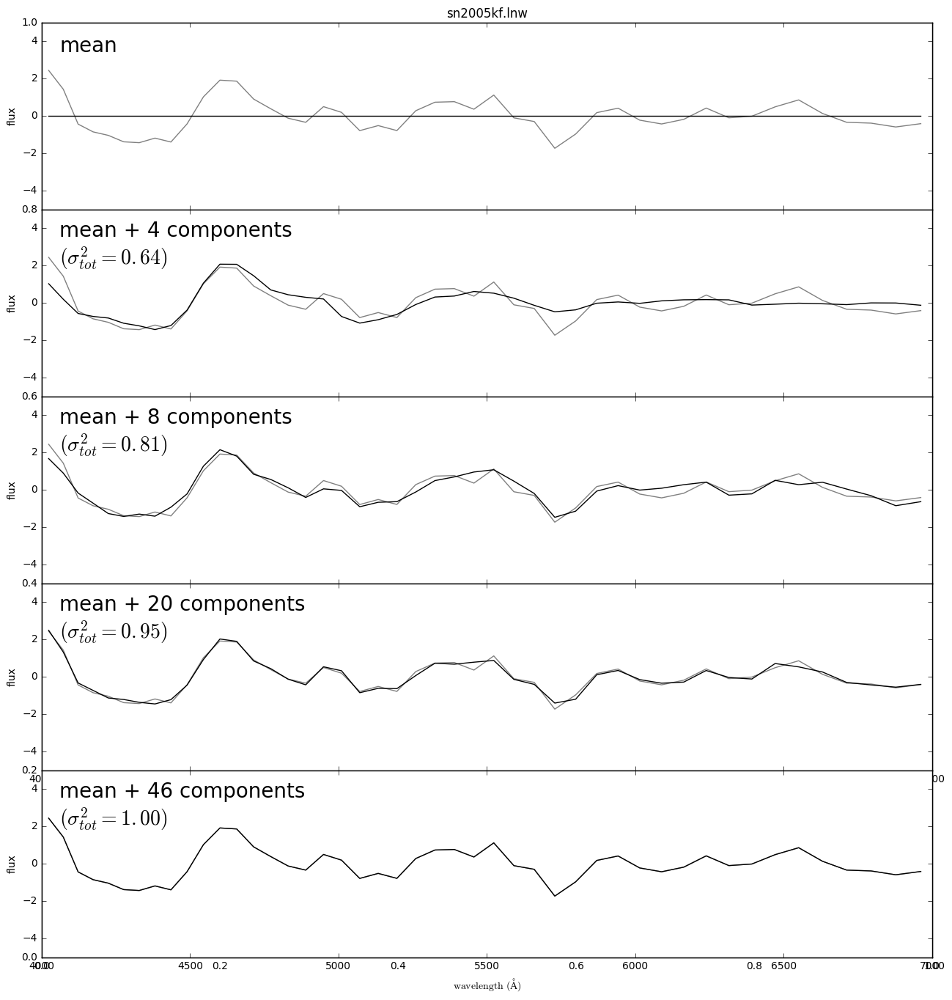

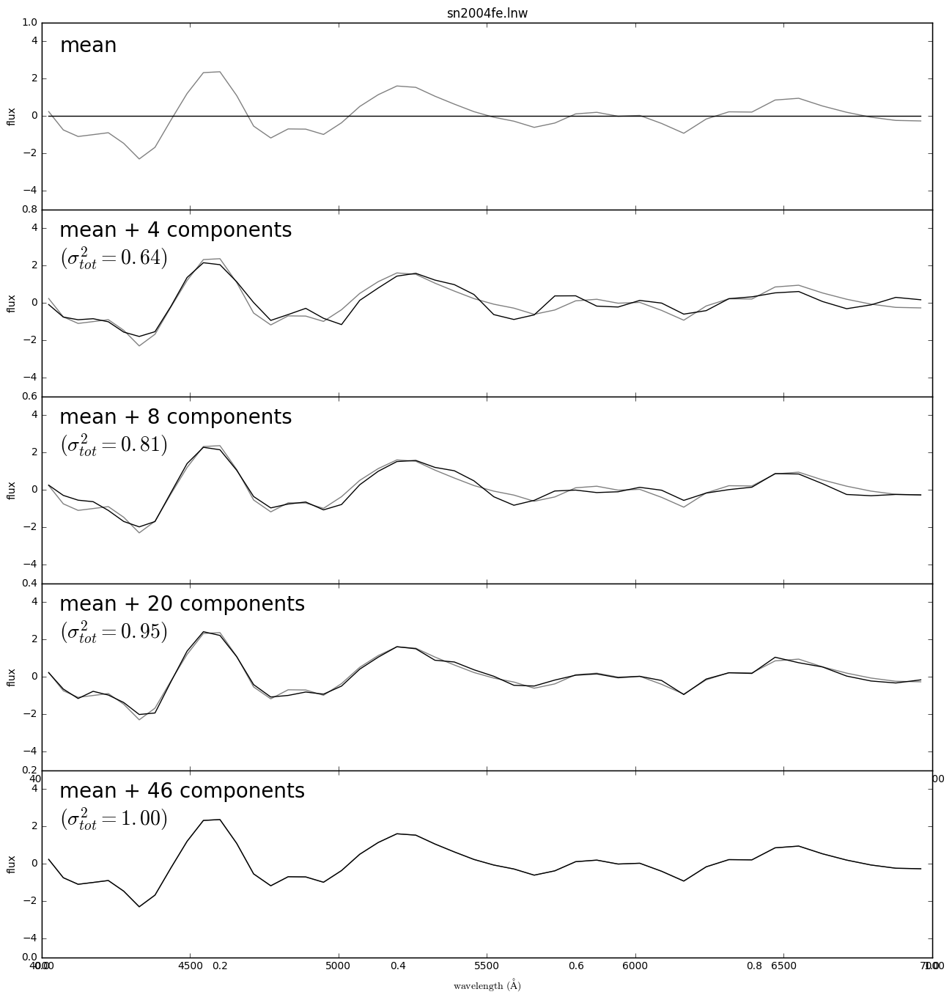

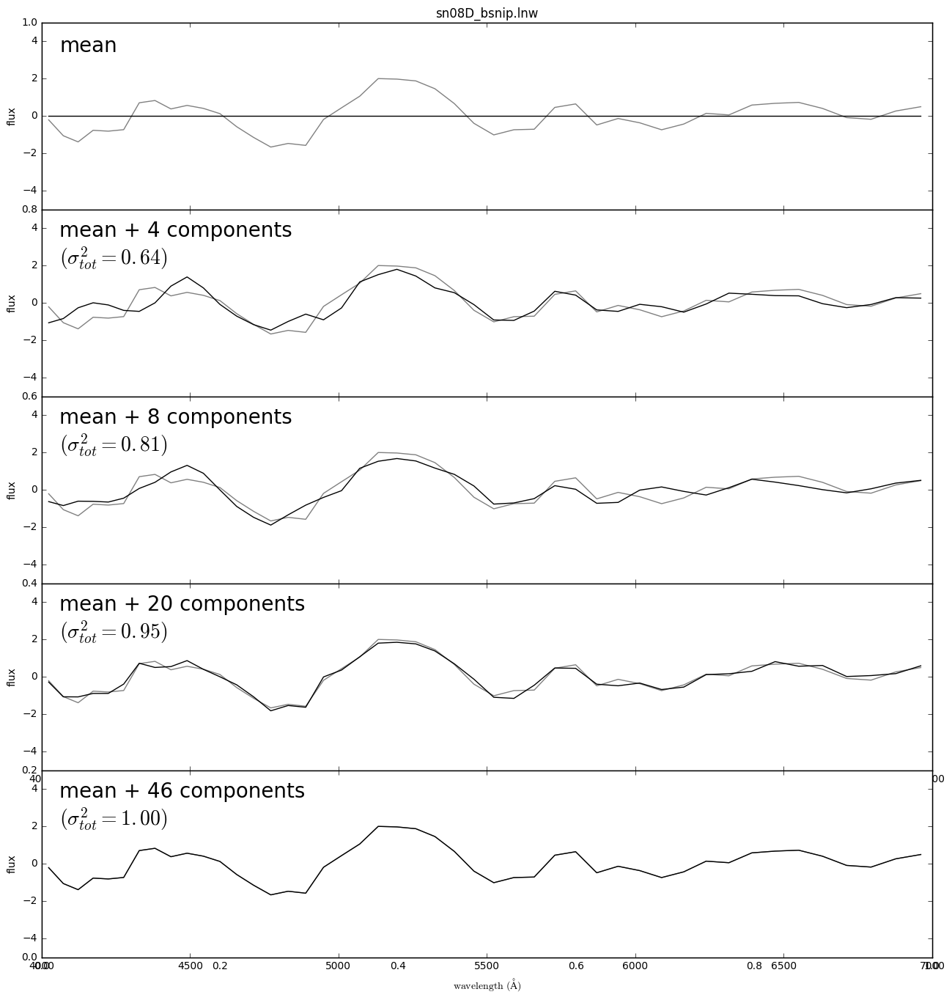

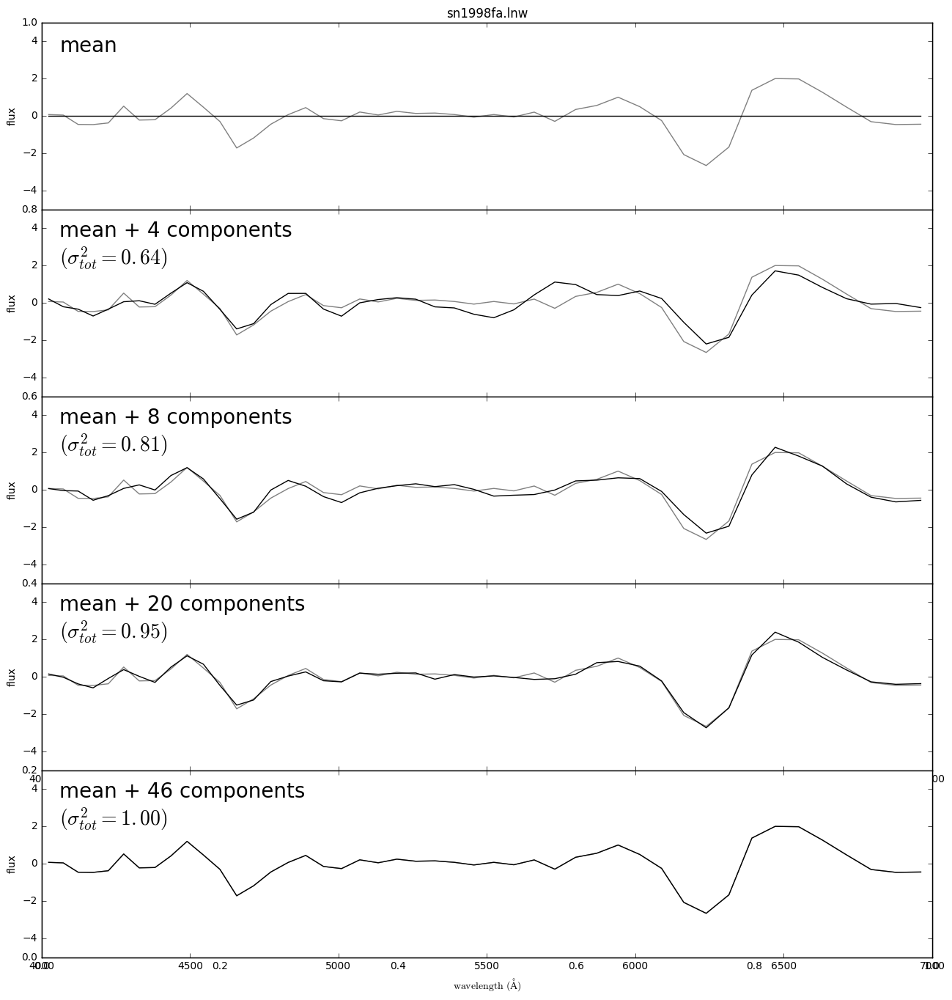

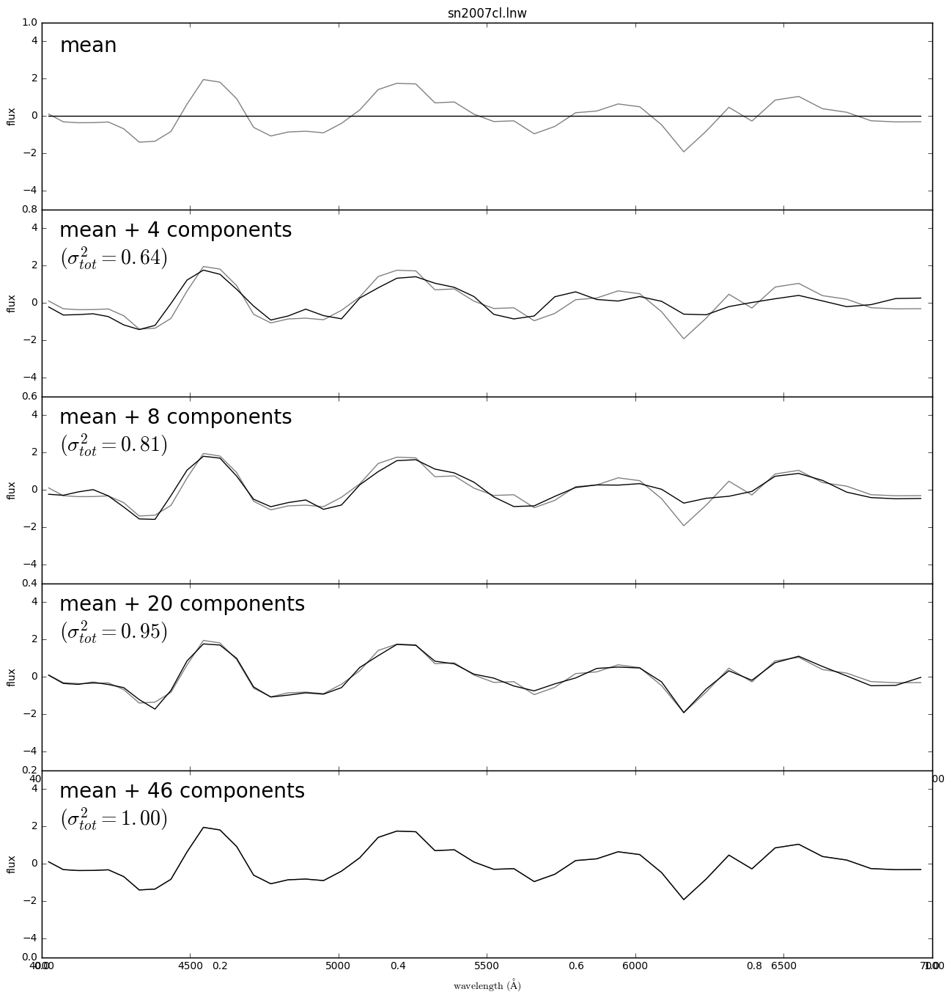

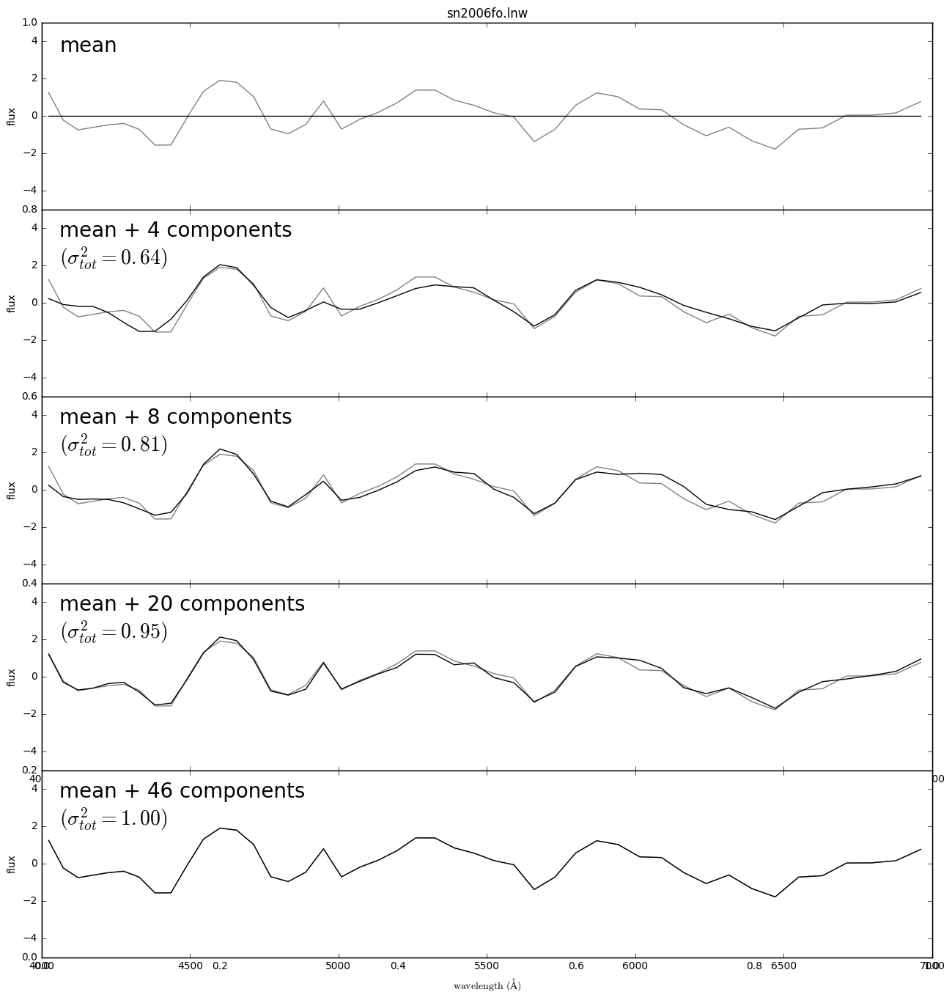

In [31]:
# Recreate 10 random spectra using the PCA decomposition
random_spec = np.random.randint(0,spectra_matrix.shape[0],10)
n_pca_components = [0,4,8,20,spectra_matrix.shape[1]]
print n_pca_components

for j,spec in enumerate(random_spec):
    spec_name = Ib_Ic_names[spec]
    true_spec = spectra_matrix[spec]
    
    pca_coeff = np.dot(evecs, spectra_matrix[spec])
    
    #------------------------------------------------------------
    # Plot the sequence of reconstructions
    fig = plt.figure(j, figsize=(15, 15))
    plt.title(spec_name)
    fig.subplots_adjust(hspace=0, top=0.95, bottom=0.1, left=0.12, right=0.93)

    for i, n in enumerate(n_pca_components):#, len(pca.components_)]):
        ax = fig.add_subplot(511 + i)
        ax.plot(wavelengths, true_spec, '-', c='gray')
        ax.plot(wavelengths, (np.dot(pca_coeff[:n], evecs[:n])), '-k')
        
        if i < 3:
            ax.xaxis.set_major_formatter(plt.NullFormatter())
            
        ax.set_ylim(-5, 5)
        ax.set_ylabel('flux')

        if n == 0:
            text = "mean"
        elif n == 1:
            text = "mean + 1 component\n"
            text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
        else:
            text = "mean + %i components\n" % n
            text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
            
        ax.text(0.02, 0.93, text, fontsize=20,ha='left', va='top', transform=ax.transAxes)

        fig.axes[-1].set_xlabel(r'${\rm wavelength\ (\AA)}$')

# 2D PCA Component Marginalizations

In [32]:
import corner

In [33]:
spectra_pca_matrix = np.ndarray(spectra_matrix.shape)
for j,spec in enumerate(spectra_matrix):
    pca_coeff = np.dot(evecs, spec)
    spectra_pca_matrix[j] = pca_coeff

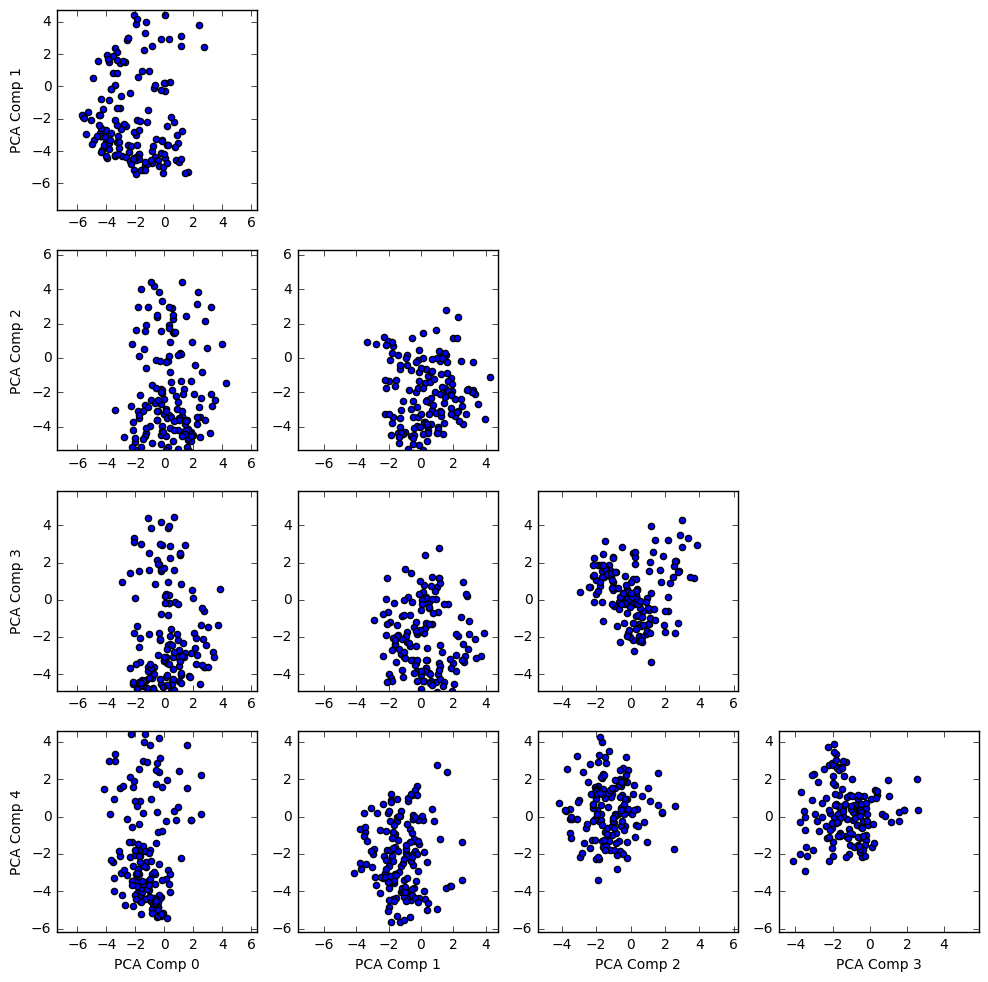

In [70]:
ncomp = 5
plt.figure(j, figsize=(15, 15))
for i in range(ncomp):
    for j in range(ncomp):
        if i > j:
            plot_number = ncomp*i+j+1
            plt.subplot(ncomp,ncomp,plot_number)
            x = spectra_pca_matrix[:,i]
            y = spectra_pca_matrix[:,j]
            plt.scatter(x,y)
            plt.xlim((np.min(spectra_pca_matrix[:,j])-2,np.max(spectra_pca_matrix[:,j])+2))
            plt.ylim((np.min(spectra_pca_matrix[:,i])-2,np.max(spectra_pca_matrix[:,i])+2))
            #plt.xlim((-5,5))
            #plt.ylim((-5,5))
            if j==0:
                plt.ylabel('PCA Comp %d'%(i))
            if i==4:
                plt.xlabel('PCA Comp %d'%(j))

## Kernel PCA

In [17]:
from sklearn.decomposition import KernelPCA

In [72]:
spectra_matrix
n_comp = 50

In [73]:
kpca = KernelPCA(kernel='rbf', fit_inverse_transform=True, n_components=n_comp)
k_dat = kpca.fit_transform(spectra_matrix)

In [75]:
kevecs = kpca.alphas_[0:n_comp]
kevals = kpca.lambdas_[0:n_comp]/np.sum(kpca.lambdas_)
kevals_cs = kevals.cumsum()



In [76]:
k_back_evecs = kpca.inverse_transform(kevecs)

In [77]:
k_back_evecs.shape

(50, 414)

In [78]:
print kevals_cs[10:20]
print evals_cs[10:20]

[ 0.5769039   0.59465683  0.61072274  0.62639106  0.64095084  0.6549047
  0.66833485  0.68161102  0.69465331  0.70738347]
[ 0.76518044  0.779341    0.79194409  0.80260677  0.81206388  0.82138326
  0.83023832  0.83810981  0.84531566  0.85226031]


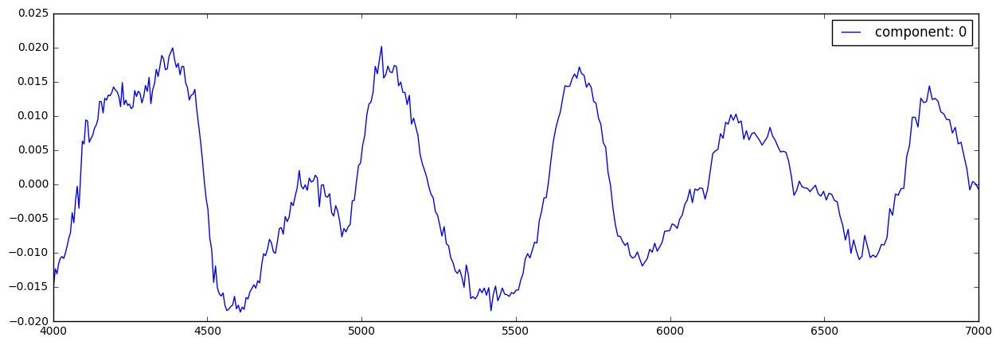

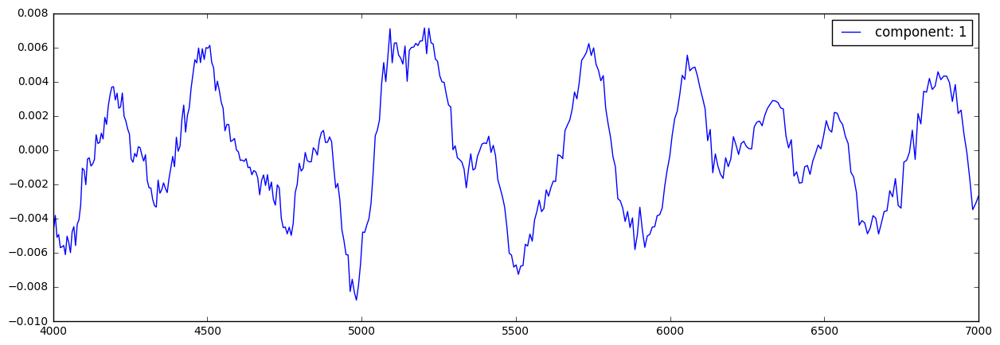

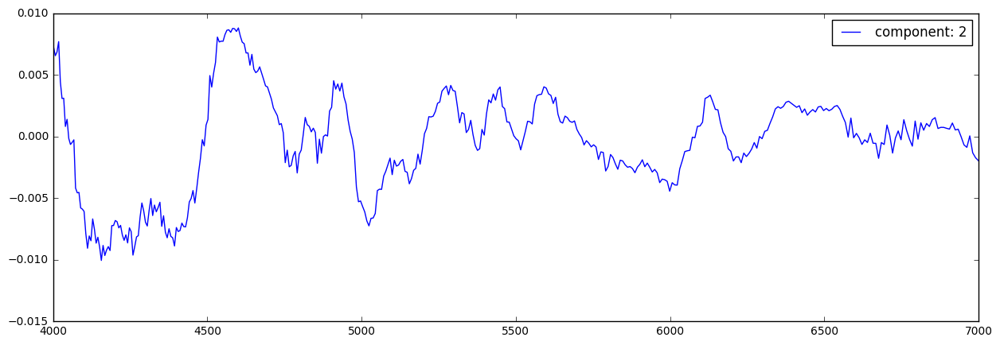

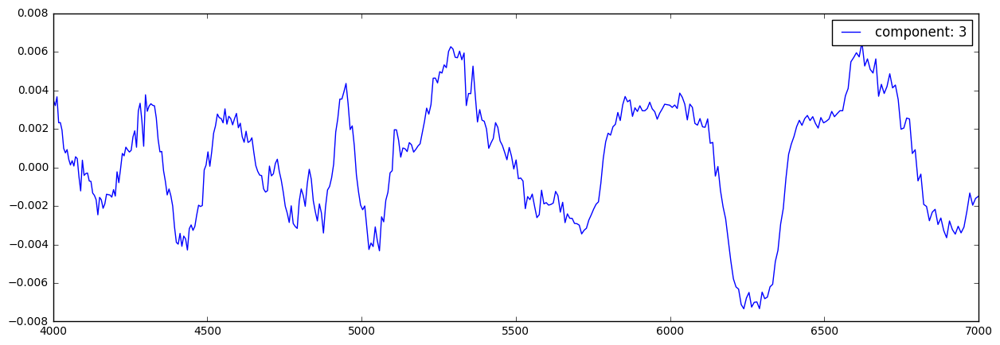

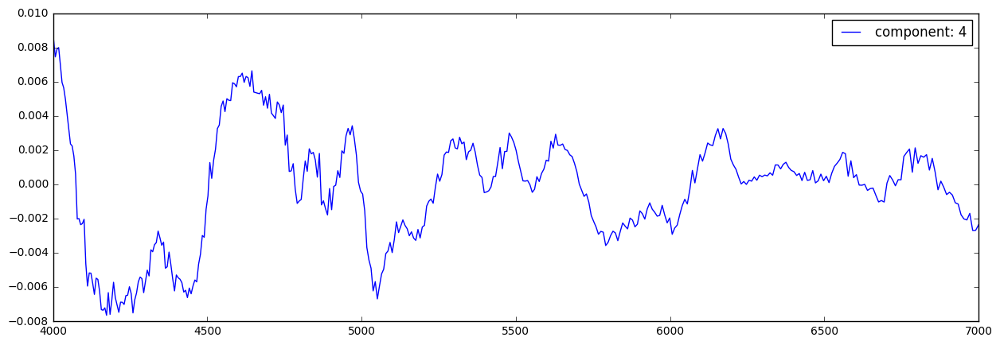

...

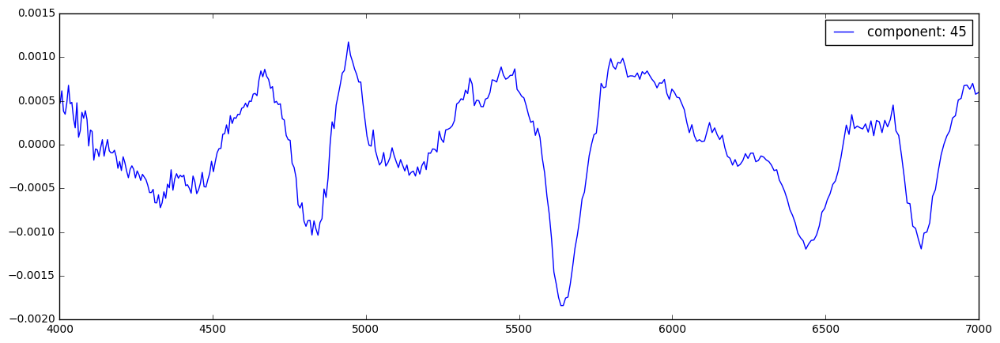

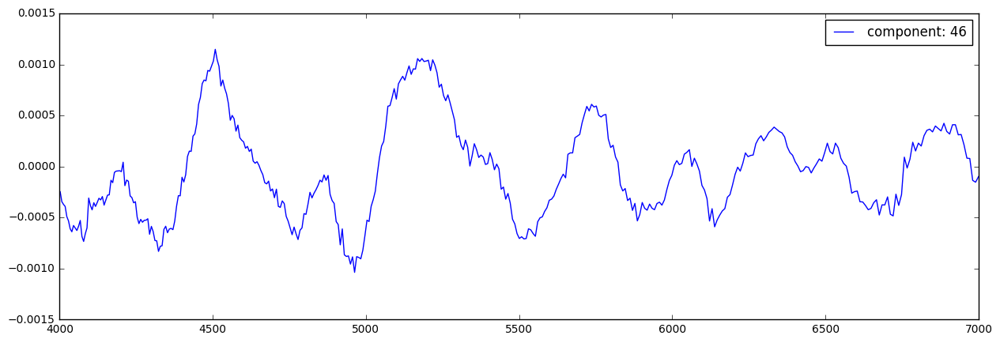

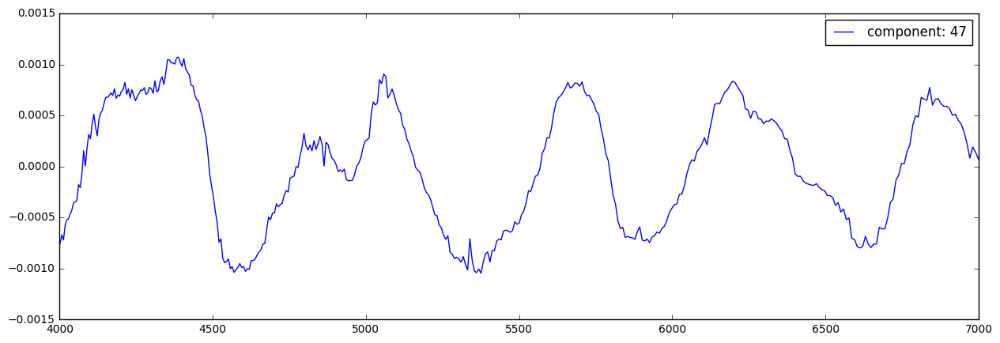

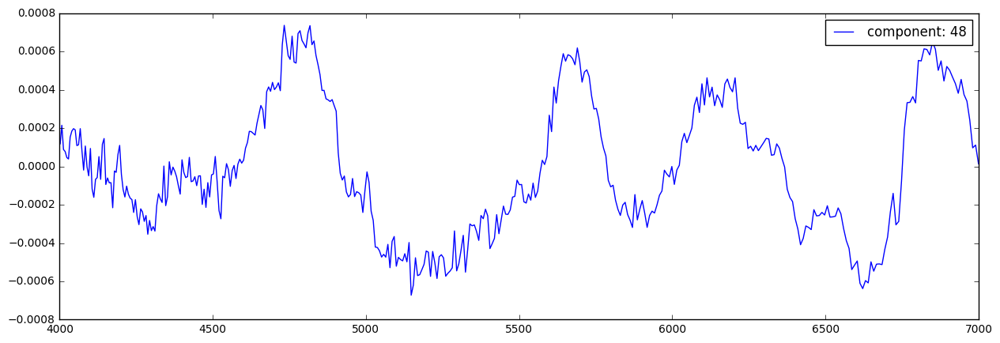

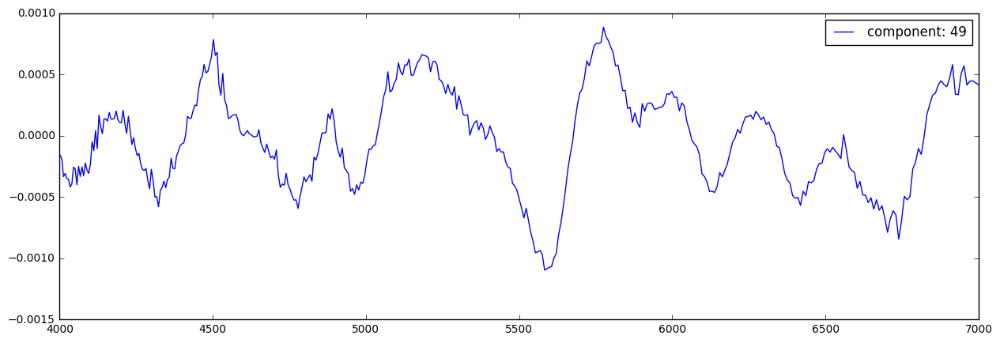

In [79]:
for i,kev in enumerate(k_back_evecs):
    plt.figure(figsize=(15,5))
    plt.plot(wavelengths,kevals[i]*(kev), label="component: %d"%i)
    plt.legend(fontsize=12)

In [54]:
spectra_pca_matrix.shape

(152, 46)

## Reconstruct Spectra using KPCA

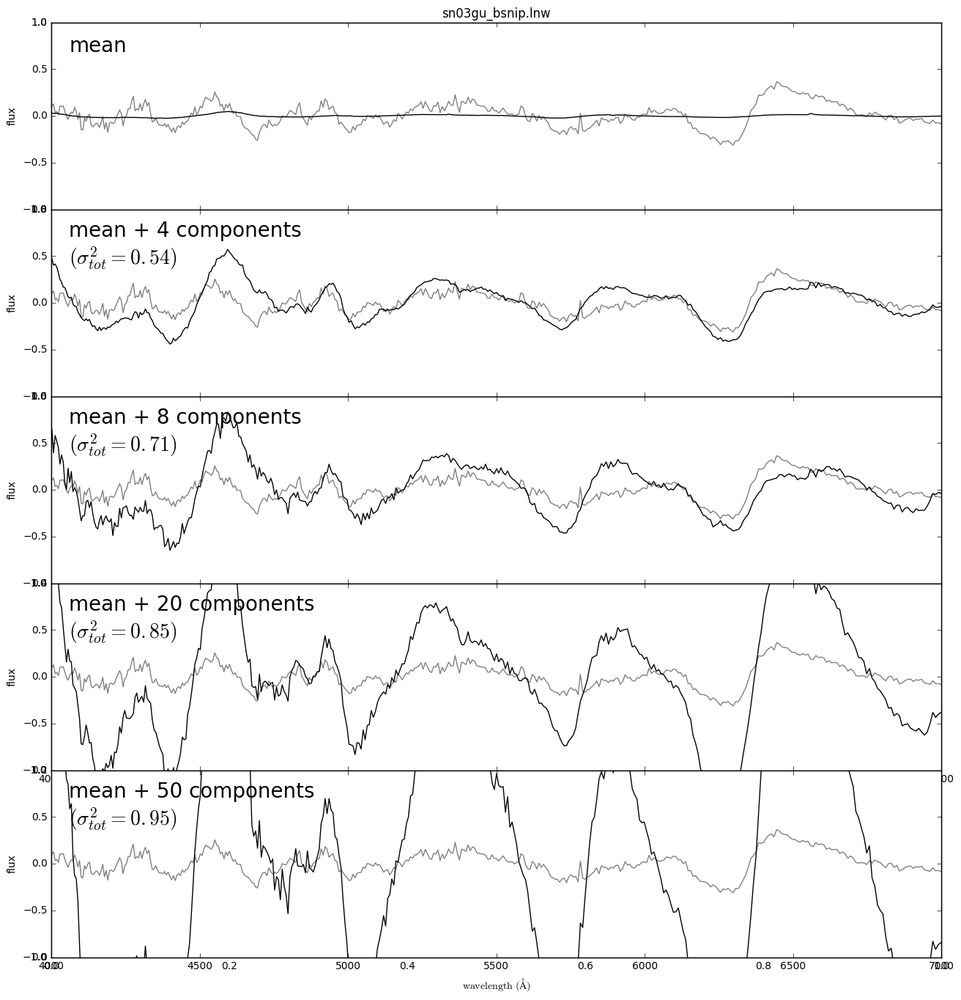

In [80]:
# Recreate 10 random spectra using the PCA decomposition
random_spec = np.random.randint(0,spectra_matrix.shape[0],1)
n_pca_components = [0,4,8,20,n_comp]

for j,spec in enumerate(random_spec):
    spec_name = Ib_Ic_names[spec]
    true_spec = (spectra_matrix[spec] + spectra_mean)*spectra_std
    
    pca_coeff = np.dot(k_back_evecs, spectra_matrix[spec])
    
    #------------------------------------------------------------
    # Plot the sequence of reconstructions
    fig = plt.figure(j, figsize=(15, 15))
    plt.title(spec_name)
    fig.subplots_adjust(hspace=0, top=0.95, bottom=0.1, left=0.12, right=0.93)

    for i, n in enumerate(n_pca_components):#, len(pca.components_)]):
        ax = fig.add_subplot(511 + i)
        ax.plot(wavelengths, true_spec, '-', c='gray')
        ax.plot(wavelengths, (spectra_mean + np.dot(pca_coeff[:n], k_back_evecs[:n]))*spectra_std, '-k')
        
        if i < 3:
            ax.xaxis.set_major_formatter(plt.NullFormatter())
            
        ax.set_ylim(-1, 1)
        ax.set_ylabel('flux')

        if n == 0:
            text = "mean"
        elif n == 1:
            text = "mean + 1 component\n"
            text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
        else:
            text = "mean + %i components\n" % n
            text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
            
        ax.text(0.02, 0.93, text, fontsize=20,ha='left', va='top', transform=ax.transAxes)

        fig.axes[-1].set_xlabel(r'${\rm wavelength\ (\AA)}$')